In [8]:
!pip3 install -U xgboost


Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 173.6 MB 35 kB/s              


# TTH-poistuma-analyysi

2016-2021 työterveyshoitajien poistumaan vaikuttavat tekijät


# Kirjastot


In [2]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import plot_roc_curve

from sklearn.datasets import make_classification

import sklearn as sk
from sklearn.linear_model import LogisticRegression

import pandas as pd
import numpy as np
import getpass
import inspect
import pymssql
import time
import datetime
from datetime import timedelta
from numpy import unique
from numpy import where
from matplotlib import pyplot


import statsmodels.api as sm
import scipy.stats as stats
import matplotlib.pyplot as plt


import pandas as pd
import os

import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline


In [ ]:
# TODO

#Laskutustiedot '19-21? Vai 15-21?

In [73]:
#!pip3 install sklearn.inspection

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement sklearn.inspection (from versions: none)
ERROR: No matching distribution found for sklearn.inspection


In [3]:
import pandas as pd

basepath='/home/stsonkos/osaajatutkimus/'
osaajatutkimus19 = pd.read_csv(basepath+'osaaja19.csv',sep=';')
osaajatutkimus20 = pd.read_csv(basepath+'osaaja20.csv',sep=';')
osaajatutkimus21 = pd.read_csv(basepath+'osaaja21.csv',sep=';')

tth = pd.read_csv(basepath+'dh-tth.csv',sep=';')
# Palkkahaku alla sql-yhteydellä
#palkat = pd.read_csv(basepath+'dw-tth-palkka.csv',sep=';')
#palkka = pd.read_csv(basepath+'palkat.csv',sep=';')
esimies = pd.read_csv(basepath+'esimies.csv',sep=';')
esimiehet = pd.read_csv(basepath+'esimies.csv',sep=';')
tth_data = pd.read_csv(basepath+'tth_data.csv',sep=';')         
listahinnat = pd.read_csv(basepath+'tth_listahinnat.csv',sep=';')

In [ ]:
# TODO: aja uusin palkka niin että ei oteta 0-palkkaa. Kokonaispalkkatieto jollain koodilla?

In [5]:
osaajatutkimus19
#vakio_tiimi_5003=Yhteistyö eri ammattiryhmien välillä toimii hyvin
#vakio_tiimi_v4=Voin luottaa kollegoiden apuun ja tukeen

,esimies,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,vakio_tiimi_v4,vakio_tiimi_5003
0,Penttinen Markus,5.0,5.0,5.0,5.0,5.0,5.0,5,3
1,Hyvösaho Ruut,3.0,1.0,3.0,3.0,4.0,5.0,4,4
2,Lappi Kirsi,4.0,4.0,4.0,4.0,4.0,4.0,4,3
3,Avila Sanna,4.0,4.0,4.0,5.0,5.0,4.0,5,2
4,Hyvösaho Ruut,99.0,99.0,99.0,4.0,99.0,99.0,3,3
...,...,...,...,...,...,...,...,...,...
3316,Rothberg Sari,5.0,5.0,99.0,3.0,4.0,4.0,5,5
3317,Terveystalo,NaN,NaN,NaN,NaN,NaN,NaN,4,4
3318,Terveystalo,NaN,NaN,NaN,NaN,NaN,NaN,5,2
3319,Terveystalo,NaN,NaN,NaN,NaN,NaN,NaN,4,3


In [7]:
# palkat

# TODO: katsotaan viimeisin palkka (jos on lopettanut, niin lopettamisvuoden palkka)

# Tuntityöläisille kerroin, jolla saadaan muunnettua vertailukelpoiseksi kk-palkaksi


# Työvuosien vaikutus, kumpaan suuntaan? ()

In [8]:
esimiehet

,EmpHK,Nimi,Henkilo_id,Esimies,Esimieshlonro,ToimiiEsimiehena
0,﻿0x9F898C352C1629E2C7B5EFDA796EE8EE,Asikainen Tarja,39172.0,Järvinen Leena,10006.0,E
1,0x421895EDBE39771E7CF6A19D24AA9FA5,Loimi Taru,45932.0,Asikainen Tiina,21200.0,E
2,0x46F3BCD3700D09754B8A369010B3E1F4,Kemppi Paula,50420.0,NaN,NaN,E
3,0xB8C2D0530F4CAFBF81D9A49239B4EA42,Närhi Lassi,50348.0,Rantanen Tuija,2058.0,E
4,0xA175A958B1468A648166157A621C6D82,Kallio Rae,55018.0,Kallio Rae,55018.0,K
...,...,...,...,...,...,...
45607,0x74B6141AE22BED4CC97F56F441E12696,Timonen Hanna,82348.0,Pöyhönen Pauliina,25197.0,E
45608,0xABFE33D87FB81340AB6AB7C1CEC2F671,Hilden Axel,82357.0,Kykyri Jani,19918.0,NaN
45609,0xED9D75A80F576DBD463965C3CC0B3F35,Söderholm Jasmin,82740.0,Hurula Kati,6952.0,E
45610,0xE43A4D17C0985E0A1386AED6BE5BAFE3,Niemi Marja,57155.0,Tähti Kati,22245.0,E


In [9]:
# Oliko tarpeen ottaa laskutuskooditieto? Ei?
listahinnat

,TTH,listahinta,koodi,vuosi
0,﻿0ARM,0.0,EL95,2017
1,1KSI,777.6,B257,2017
2,0MAN,52358.4,D204,2018
3,3HPJ,345.6,B257,2020
4,6KRS,86.4,C251,2021
...,...,...,...,...
211317,1PIG,25228.8,D204,2014
211318,8ARX,3696.0,B206,2015
211319,1GUL,86.4,C240,2019
211320,1NEA,1848.0,B201,2015


In [10]:
osaajatutkimus19['esimies'] = osaajatutkimus19['esimies'].str.replace(" ","")
osaajatutkimus21['esimies'] = osaajatutkimus21['esimies'].str.replace(" ","")
osaajatutkimus20['esimies'] = osaajatutkimus20['esimies'].str.replace(" ","")

In [41]:
# SQL-haku

In [13]:
## Salasana 

passwd = getpass.getpass(prompt='Password: ', stream=None)

Password: ········


In [14]:
# Käännä tähän oma käyttäjätunnus
# DW-yhteys
conn = pymssql.connect(server='stsqldw01', port='1433', database='DV20', user='STAD\\k034812', password=passwd)
cursor = conn.cursor()

# DH-mirror
mirror_conn = pymssql.connect(server='stdhmirror01\stdhmirror01', port='56389', database='Doctorex_mirror', user='stad\k034812', password=passwd)
cursor = mirror_conn.cursor()

In [15]:
sql_haku = inspect.cleandoc("""
SELECT [EmploymentHK] ,max(Arvo) as palkka
  FROM [DV20].[hrm].[D_Palkkaperuste]
  where LaskentatunnisteenSelitys='Kokonaispalkka palkkalaskelmalle'
  and Arvo is not null
  group by EmploymentHK
  order by EmploymentHK
              """)
start = time.time()
palkka = pd.read_sql(sql_haku,conn)
end = time.time()
print("Aikaa kului palkkojen hakuun",(end-start),"sekuntia")



Aikaa kului palkkojen hakuun 29.158644914627075 sekuntia


In [13]:
palkka.value_counts()

EmploymentHK                        palkka 
0xFFFB6F76649BCA5FED0E548814D4DE2C  2616.78    1
0x54CB5CCD3C46991FD43207A23C1CC0A8  3000.00    1
0x55135B8C792EB9EA153A59AA12B12109  2328.67    1
0x550BAA834EA051F28E93E69A1D4B9644  2677.19    1
0x5506B38853CCAE3216C90BC65D68DC24  3309.73    1
                                              ..
0xAB9D5232785EEB653D6C922656AC448D  2370.86    1
0xAB964F7B8EAE308DE8432DE5A485C6DA  2321.26    1
0xAB9614C3DC953DBFADA1627CE16C3B0B  1899.40    1
0xAB961209B94CD81F7D0BDED015545F54  2783.19    1
0x000487059E2FF3829D1EA286C3CC9E97  3251.22    1
Length: 17099, dtype: int64

In [16]:
# Työsuhteen tiedot, päättymissyy mukana

sql_haku = inspect.cleandoc("""
SELECT distinct [EmploymentHK]
      ,t.[PersonHK]
      ,[Tyosuhde_id]
      ,h.[Henkilo_id]
      ,SyntAika
      ,h.Sukupuoli 
      ,[AlkuPvm]
      ,[PaattymisPvm]
	  ,PaattymisSyy
	  ,PaattymisSyyId
FROM [DV20].[hrm].[F_Tyosuhde] t
left join  [DV20].[hrm].[D_Henkilo] h on h.PersonHK=t.PersonHK
LEFT JOIN [DV20].[hrm].[D_Nimike] n on n.PersonHK = h.PersonHK  
where Nimike like '%terveyshoitaja%'

order by PersonHK
            """)
start = time.time()
tyosuhteet = pd.read_sql(sql_haku,conn)
end = time.time()
print("Aikaa kului työsuhteiden hakuun",(end-start),"sekuntia")



Aikaa kului työsuhteiden hakuun 3.9730730056762695 sekuntia


In [8]:
#where Tyotehtava like '%terveyshoitaja%'
tyosuhteet

,EmploymentHK,PersonHK,Tyosuhde_id,Henkilo_id,SyntAika,Sukupuoli,AlkuPvm,PaattymisPvm,PaattymisSyy,PaattymisSyyId
0,0xBC1B1FC11D91A32588C11577974CBD5E,0x000A097FC2EBE21D778AA3F39F29DA48,226839,102269,1988-05-30,N,2023-03-06,NaT,None,None
1,0x765D8D4FE53B43D6718491BC19CFCA09,0x0019FB46E8329F88ED6B39512A8259FD,27099,29424,1980-10-18,N,2016-01-01,NaT,None,None
2,0x57D8B1523DA6E39893D0D9133BC69D53,0x006A984F1EA7912E252147FDE1B6FA27,53440,40229,1953-05-02,N,2011-01-03,2016-05-31,Vanhuuseläke,9
3,0xCFB6C42194ED347F61E1369EDDD5D2C0,0x006A984F1EA7912E252147FDE1B6FA27,119253,40229,1953-05-02,N,2017-04-07,2017-04-13,Määräaikaisuuden päättyminen,1
4,0xCA4C259B1F6F36DD06F15070110BDAAE,0x006C9EC02E33A9E24D891A00EF4B0D89,192405,82243,1992-04-17,N,2022-03-14,NaT,None,None
...,...,...,...,...,...,...,...,...,...,...
3071,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,0xFF705925D6FDD6B8A77EB2DD615C0AEA,146016,63649,1993-02-20,N,2019-06-03,NaT,None,None
3072,0xBEC35CA5F8E91C877B139200E6BE6521,0xFF899972AC6944248877356C6B502201,140269,62120,1982-07-11,N,2019-01-28,NaT,None,None
3073,0xE9C300ED0F374A0E5C6F9E9EC550D470,0xFFC85425765A48FC1660B4DB66C422E4,155790,67865,1974-12-02,N,2020-02-01,2020-03-31,Siirto toiseen maksuryhmään,20
3074,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,0xFFC85425765A48FC1660B4DB66C422E4,159329,67865,1974-12-02,N,2020-04-01,NaT,None,None


In [17]:
from datetime import datetime, date
#tyosuhteet.SyntAika

In [16]:
palkka

,EmploymentHK,palkka
0,0x000487059E2FF3829D1EA286C3CC9E97,3251.22
1,0x000881D443601D4BCD1B867C9586FACD,2699.51
2,0x000BB8C882FBC3301A6BBE509B588C00,2718.37
3,0x00211D3AF747751B1047746DE2F84772,2996.46
4,0x0045B7816B3F2F3AC5BD5A68C34F05F4,3556.35
...,...,...
2429,0xFFC26FB71F674CE602F8CEE9B8B8CD35,2953.03
2430,0xFFC96B0D9CCC16B00BC68073D2917407,3107.78
2431,0xFFD17AC2FE59F4C95C3B0418EEDB29EE,3069.96
2432,0xFFE02D232A7F0FCA0FADF68F9EFECB61,3126.14


In [18]:
# TODO
# tarkista miten työsuhteet on haettu, kun näitä on enemmän kuin tuolla palkkataulukossa
# poistetaan kaikki aikarajaukset molemmista
tyosuhteet

,EmploymentHK,PersonHK,Tyosuhde_id,Henkilo_id,SyntAika,Sukupuoli,AlkuPvm,PaattymisPvm,PaattymisSyy,PaattymisSyyId
0,0xBC1B1FC11D91A32588C11577974CBD5E,0x000A097FC2EBE21D778AA3F39F29DA48,226839,102269,1988-05-30,N,2023-03-06,NaT,None,None
1,0x765D8D4FE53B43D6718491BC19CFCA09,0x0019FB46E8329F88ED6B39512A8259FD,27099,29424,1980-10-18,N,2016-01-01,NaT,None,None
2,0x57D8B1523DA6E39893D0D9133BC69D53,0x006A984F1EA7912E252147FDE1B6FA27,53440,40229,1953-05-02,N,2011-01-03,2016-05-31,Vanhuuseläke,9
3,0xCFB6C42194ED347F61E1369EDDD5D2C0,0x006A984F1EA7912E252147FDE1B6FA27,119253,40229,1953-05-02,N,2017-04-07,2017-04-13,Määräaikaisuuden päättyminen,1
4,0xCA4C259B1F6F36DD06F15070110BDAAE,0x006C9EC02E33A9E24D891A00EF4B0D89,192405,82243,1992-04-17,N,2022-03-14,NaT,None,None
...,...,...,...,...,...,...,...,...,...,...
3072,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,0xFF705925D6FDD6B8A77EB2DD615C0AEA,146016,63649,1993-02-20,N,2019-06-03,NaT,None,None
3073,0xBEC35CA5F8E91C877B139200E6BE6521,0xFF899972AC6944248877356C6B502201,140269,62120,1982-07-11,N,2019-01-28,NaT,None,None
3074,0xE9C300ED0F374A0E5C6F9E9EC550D470,0xFFC85425765A48FC1660B4DB66C422E4,155790,67865,1974-12-02,N,2020-02-01,2020-03-31,Siirto toiseen maksuryhmään,20
3075,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,0xFFC85425765A48FC1660B4DB66C422E4,159329,67865,1974-12-02,N,2020-04-01,NaT,None,None


In [19]:
tyosuhteet

ts=pd.merge(
    tyosuhteet,
    palkka,
    how="left")


In [12]:
ts

,EmploymentHK,PersonHK,Tyosuhde_id,Henkilo_id,SyntAika,Sukupuoli,AlkuPvm,PaattymisPvm,PaattymisSyy,PaattymisSyyId,palkka
0,0xBC1B1FC11D91A32588C11577974CBD5E,0x000A097FC2EBE21D778AA3F39F29DA48,226839,102269,1988-05-30,N,2023-03-06,NaT,None,None,NaN
1,0x765D8D4FE53B43D6718491BC19CFCA09,0x0019FB46E8329F88ED6B39512A8259FD,27099,29424,1980-10-18,N,2016-01-01,NaT,None,None,NaN
2,0x57D8B1523DA6E39893D0D9133BC69D53,0x006A984F1EA7912E252147FDE1B6FA27,53440,40229,1953-05-02,N,2011-01-03,2016-05-31,Vanhuuseläke,9,3201.65
3,0xCFB6C42194ED347F61E1369EDDD5D2C0,0x006A984F1EA7912E252147FDE1B6FA27,119253,40229,1953-05-02,N,2017-04-07,2017-04-13,Määräaikaisuuden päättyminen,1,NaN
4,0xCA4C259B1F6F36DD06F15070110BDAAE,0x006C9EC02E33A9E24D891A00EF4B0D89,192405,82243,1992-04-17,N,2022-03-14,NaT,None,None,2928.69
...,...,...,...,...,...,...,...,...,...,...,...
3071,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,0xFF705925D6FDD6B8A77EB2DD615C0AEA,146016,63649,1993-02-20,N,2019-06-03,NaT,None,None,3222.90
3072,0xBEC35CA5F8E91C877B139200E6BE6521,0xFF899972AC6944248877356C6B502201,140269,62120,1982-07-11,N,2019-01-28,NaT,None,None,3905.55
3073,0xE9C300ED0F374A0E5C6F9E9EC550D470,0xFFC85425765A48FC1660B4DB66C422E4,155790,67865,1974-12-02,N,2020-02-01,2020-03-31,Siirto toiseen maksuryhmään,20,2846.03
3074,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,0xFFC85425765A48FC1660B4DB66C422E4,159329,67865,1974-12-02,N,2020-04-01,NaT,None,None,3160.68


In [20]:
# työsuhteet palkkojen kanssa, tarkista osuudet
A=(ts.palkka>1)

In [21]:
A.value_counts()


True     2623
False     454
Name: palkka, dtype: int64

In [22]:
vaihtuvuus=ts[ts.PaattymisSyy=='Oma pyyntö']

In [23]:
ts[ts.PaattymisSyy=='Oma pyyntö']

,EmploymentHK,PersonHK,Tyosuhde_id,Henkilo_id,SyntAika,Sukupuoli,AlkuPvm,PaattymisPvm,PaattymisSyy,PaattymisSyyId,palkka
17,0x976B0536C0A919FCFDFEF88EEA39241F,0x0154D6704354F964ED44074C1CCB6C29,53248,40048,1972-08-22,N,2010-01-01,2014-06-05,Oma pyyntö,0,3428.16
18,0xC608C15F7CE98610BB27EB8BF2B50EAD,0x0154D6704354F964ED44074C1CCB6C29,141463,40048,1972-08-22,N,2019-02-01,2022-07-20,Oma pyyntö,0,2937.70
21,0xBFA356AE046A1522CD96508BAC5C3DD2,0x024007E1831952D1C84D97052BB7F2DE,87451,48116,1983-06-18,N,2012-10-01,2018-03-18,Oma pyyntö,0,2768.62
24,0xBDCB0478F89D2D175043D3B38B163F43,0x02A6BFD29B17620FB4124A05B6CA62DC,142429,62485,1985-05-18,N,2019-03-04,2020-06-30,Oma pyyntö,0,2950.47
28,0xBC22D30A86BEB050D8BF9255280549FA,0x02FB29661EC5D55054D6285A3F97E149,51347,38258,1968-10-28,N,2011-10-24,2013-02-28,Oma pyyntö,0,2965.32
...,...,...,...,...,...,...,...,...,...,...,...
3067,0xC661283E8E188BEA9E466FDB7AD9BCC8,0xFF2A2F87824E2E865BEFC254E7E55094,202499,86367,1985-08-02,N,2022-05-02,2023-03-05,Oma pyyntö,0,3074.66
3068,0xBDEFF051B34A03AFA7F06A65A1CF5DAF,0xFF2D9083FAB3C4029706B15E54440BD7,51889,38776,1960-10-29,N,2010-01-01,2020-08-23,Oma pyyntö,0,3002.96
3069,0x97B5076A3CE2FB30F744262E608D9121,0xFF324E8F1CCED6E3CF38010EDB89BB96,146960,63845,1969-07-28,N,2019-08-12,2020-11-06,Oma pyyntö,0,2970.28
3071,0x7851D7291DFDDDE96B09C8CFAA264048,0xFF5D84E3D819A31AF2602A1DD55AB7EA,130818,58299,1978-12-31,N,2018-03-12,2018-07-31,Oma pyyntö,0,NaN


In [24]:
# Haetaan hoitajien vaihtuvuus, asiakasyritykset, huollettavien määrä DH:lta

# Haetaan ensin DH-tunnukset
#pos: Tyosuhde_ID, aktiivinen
sql_haku = inspect.cleandoc("""
select distinct DXid as TTH, mepco_nimi as nimi, Henkilo_ID
from [raportointi_aputaulut].[dbo]._kayttajaTunnus_stg

            """)
start = time.time()
TMPTTH = pd.read_sql(sql_haku,mirror_conn)
end = time.time()
print("Aikaa kului tunnusten hakuun",(end-start),"sekuntia")

# Yritysten koot Doctorex_mirrorilta  
# (LKRIt, firmat ja asiakasmaarat)

# !!
# Tarkista Lauralta, ettei koko konsernin työntekijät valu yhdelle TTH:lle
# !!
#TMPtt
sql_haku = inspect.cleandoc("""
select LY_TUNNUS, TTARK_TMP, firmat.TOIMIALANIMI, sum(tyontekijoita) as tyontekijoita 
from (
select t.LY_TUNNUS, TTARK_TMP,tolk.TOL2008_NIMIKE as TOIMIALANIMI, count(HT) as tyontekijoita
from [Doctorex_mirror].[dbo].[tekijat] t
LEFT JOIN [Doctorex_mirror].[dbo].[yritys] y on y.LY_TUNNUS =  t.LY_TUNNUS
left join tol2008k tolk on tolk.TOL2008_KOODI = y.TOL2008_KOODI
where A_PVM>0 and isnull(L_PVM,0) = 0 
group by t.LY_TUNNUS,TTARK_TMP, tolk.TOL2008_NIMIKE ) firmat
group by LY_TUNNUS, TTARK_TMP, firmat.TOIMIALANIMI
            """)
start = time.time()
TMPtt = pd.read_sql(sql_haku,mirror_conn)
end = time.time()
print("Aikaa kului yritysten kokojen hakuun",(end-start),"sekuntia")


# Kaikki jaetaan nimetyt työterveyshoitajat (TTH1-4) yritysten kesken

#TMPsop
sql_haku = inspect.cleandoc("""
select TTH1 as TTH, LY_TUNNUS, TOIMIPISTE
FROM [Doctorex_mirror].[dbo].[sop_asemat]
where len(TTH1)>0
UNION
select TTH2 as TTH, LY_TUNNUS,TOIMIPISTE
FROM [Doctorex_mirror].[dbo].[sop_asemat]
where len(TTH2)>0
UNION
select TTH3 as TTH, LY_TUNNUS,TOIMIPISTE
FROM [Doctorex_mirror].[dbo].[sop_asemat]
where len(TTH3)>0
UNION
select TTH4 as TTH, LY_TUNNUS,TOIMIPISTE
FROM [Doctorex_mirror].[dbo].[sop_asemat]
where len(TTH4)>0
            """)
start = time.time()
TMPsop = pd.read_sql(sql_haku,mirror_conn)
end = time.time()
print("Aikaa kului sopimusasemien hakuun",(end-start),"sekuntia")


###
### select count(TTH) hoitajia,LY_TUNNUS, TOIMIPISTE into #TMPhoitajat from #TMPsop group by LY_TUNNUS, TOIMIPISTE

hoitajia=TMPsop.groupby(['LY_TUNNUS','TOIMIPISTE']).agg({'TTH': 'count'}).reset_index()


Aikaa kului tunnusten hakuun 0.14098000526428223 sekuntia
Aikaa kului yritysten kokojen hakuun 1.9635412693023682 sekuntia
Aikaa kului sopimusasemien hakuun 0.5652761459350586 sekuntia


In [25]:
TMPTTH

,TTH,nimi,Henkilo_ID
0,None,Aahos Ilkka,69026
1,None,Aalisto Eeva,79551
2,None,Aallonvuori Erika,51249
3,None,Aallosvirta Jenni,64525
4,None,Aaltio Niina,81942
...,...,...,...
25081,YBE,Bergvik Yvonne,39185
25082,YLEM,Yliheljo Émil,67249
25083,YLIJ,Ylikojola Juha,68642
25084,YVTA,Talvenvaltia Yvonne,72892


In [19]:
#hinnat=pd.merge(
#    listahinnat,
#    TMPTTH,
#    how="left")

In [20]:
#hinnat

,TTH,listahinta,koodi,vuosi,nimi,Henkilo_ID
0,﻿0ARM,0.0,EL95,2017,NaN,NaN
1,1KSI,777.6,B257,2017,Kaasalainen Sirpa,38463.0
2,0MAN,52358.4,D204,2018,Nordberg Marjo,39918.0
3,3HPJ,345.6,B257,2020,Herrala-Porkka Jenna,63327.0
4,6KRS,86.4,C251,2021,Salminen Kirsi,62867.0
...,...,...,...,...,...,...
214170,1PIG,25228.8,D204,2014,Hagström Pinja,45526.0
214171,8ARX,3696.0,B206,2015,Rintakumpu Annukka,51660.0
214172,1GUL,86.4,C240,2019,Guerrero Pagkratis Lucia,51680.0
214173,1NEA,1848.0,B201,2015,Kanto Nea,50820.0


In [26]:
# Sopimusasemakoodit liitettynä työterveyshoitajan dh-tunnukseen
TMPsop

,TTH,LY_TUNNUS,TOIMIPISTE
0,1437,195370,1DKE
1,8KPP,297848,8MCE
2,4SVE,495460,4TDA
3,1RJ8,162476,1TIA
4,0VVI,951817,0RVA
...,...,...,...
144038,6EMM,697862,6HEV
144039,3VSA,393223,3LPR
144040,9PSN,996602,9SUI
144041,5KVM,693535,5KMK


In [17]:
TMPTTH

,TTH,nimi,Henkilo_ID
0,None,Aahos Ilkka,69026
1,None,Aalisto Eeva,79551
2,None,Aallonvuori Erika,51249
3,None,Aallosvirta Jenni,64525
4,None,Aaltio Niina,81942
...,...,...,...
24961,YBE,Bergvik Yvonne,39185
24962,YLEM,Yliheljo Émil,67249
24963,YLIJ,Ylikojola Juha,68642
24964,YVTA,Talvenvaltia Yvonne,72892


In [27]:
# hoitajat toimipisteittäin ja yrityksittäin
hoitajia

,LY_TUNNUS,TOIMIPISTE,TTH
0,002295,1MYY,1
1,007100,1MYY,1
2,007500,1MYY,1
3,010710,5POR,1
4,01125286,6FLM,1
...,...,...,...
118959,ROADCON,0SAP,1
118960,SUOMEN SALI,8SEI,1
118961,TEHOKAT OY,8STS,1
118962,VELJEKSET A,6TUL,2


In [25]:
# esikatsellaan osaajatutkimuksen datoja esimiesnäkökulmasta (keskiarvot)
#osaajatutkimus19

In [28]:
# Poistetaan 99:ksi laitetut pois keskiarvosta
# yhdistetään
osaajatut=pd.concat([osaajatutkimus19,osaajatutkimus20,osaajatutkimus21])
osaajatut=osaajatut.replace({99.0:np.nan})

In [29]:
osaajatut=osaajatut.rename(columns={"vakio_tiimi_v4": "kollegoiden_apu", "vakio_tiimi_5003": "yhteistyo_ammattiryhmissa"})

#vakio_tiimi_5003=Yhteistyö eri ammattiryhmien välillä toimii hyvin
#vakio_tiimi_v4=Voin luottaa kollegoiden apuun ja tukeen

In [17]:
osaajatut

,esimies,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute
0,PenttinenMarkus,5.0,5.0,5.0,5.0,5.0,5.0,5.0,3.0,NaN,NaN,NaN
1,HyvösahoRuut,3.0,1.0,3.0,3.0,4.0,5.0,4.0,4.0,NaN,NaN,NaN
2,LappiKirsi,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,NaN,NaN,NaN
3,AvilaSanna,4.0,4.0,4.0,5.0,5.0,4.0,5.0,2.0,NaN,NaN,NaN
4,HyvösahoRuut,NaN,NaN,NaN,4.0,NaN,NaN,3.0,3.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
581,NaN,5.0,4.0,4.0,5.0,5.0,4.0,5.0,5.0,4.0,NaN,5.0
582,NaN,2.0,2.0,2.0,NaN,2.0,NaN,3.0,3.0,1.0,NaN,2.0
583,NaN,3.0,3.0,3.0,4.0,3.0,3.0,4.0,3.0,3.0,NaN,4.0
584,NaN,3.0,4.0,3.0,4.0,3.0,4.0,3.0,2.0,2.0,NaN,2.0


In [30]:
ot_keskiarvo=osaajatut.groupby('esimies')['E_auttaaonnistumaan', 'E_viestinta', 'E_oikeudenmukaisuus',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'kollegoiden_apu',
       'yhteistyo_ammattiryhmissa', 'E_osaajataidot', ' E_palaute', 'E_palaute'].mean().reset_index()

/home/stsonkos/.local/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  This is separate from the ipykernel package so we can avoid doing imports until


In [21]:
osaajatut.columns

Index(['esimies', 'E_auttaaonnistumaan', 'E_viestinta', 'E_oikeudenmukaisuus',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'kollegoiden_apu',
       'yhteistyo_ammattiryhmissa', 'E_osaajataidot', ' E_palaute',
       'E_palaute'],
      dtype='object')

In [22]:
ot_hajonta=osaajatut.groupby('esimies').std().reset_index()

In [24]:
ot_hajonta[['E_auttaaonnistumaan', 'E_viestinta', 'E_oikeudenmukaisuus',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'kollegoiden_apu',
       'yhteistyo_ammattiryhmissa', 'E_osaajataidot', ' E_palaute', 'E_palaute']]

,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute
0,1.055290,1.187542,1.183216,1.009050,1.322876,0.452267,0.869718,0.900337,0.900337,NaN,0.738549
1,1.337494,0.994429,1.536591,1.333333,0.971825,1.264911,1.032796,1.074968,1.301708,1.603567,NaN
2,0.966092,0.737865,0.927961,1.054093,0.866025,0.726483,1.475730,0.875595,0.948683,0.816497,1.154701
3,1.258306,1.258306,1.527525,1.258306,1.527525,0.577350,1.290994,0.957427,1.414214,1.527525,NaN
4,0.909491,0.931605,0.992815,0.918801,1.043805,0.954686,0.825951,0.912228,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
128,0.690066,0.899735,0.816497,0.786796,1.253566,0.487950,1.112697,0.899735,1.069045,0.836660,NaN
129,0.874475,1.200490,0.927520,0.853913,0.963933,0.664211,0.966345,0.996317,0.919559,0.770329,0.577350
130,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
131,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [25]:
ot_keskiarvo

,esimies,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute
0,2,3.750000,3.923077,4.000000,4.272727,3.666667,4.750000,4.615385,3.583333,3.083333,NaN,4.000000
1,AlankoSatu,2.700000,3.100000,3.111111,3.000000,2.777778,4.400000,4.200000,3.600000,2.777778,3.000000,4.000000
2,AntikainenPäivi,3.600000,4.100000,4.111111,4.111111,3.666667,4.444444,4.200000,4.100000,3.700000,4.000000,4.333333
3,AnttilaMari-Anne,2.750000,2.250000,2.666667,2.750000,2.333333,4.500000,3.500000,2.750000,3.000000,2.666667,NaN
4,AvilaSanna,4.086275,3.832669,4.077869,4.191837,3.873950,3.918455,4.234615,3.800797,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
128,VitikkaMaarit,3.857143,4.142857,4.000000,4.428571,3.714286,4.714286,4.285714,2.857143,4.142857,4.500000,3.000000
129,VolanenTarja,3.529412,3.235294,3.882353,4.062500,3.437500,4.235294,4.058824,3.352941,3.705882,3.857143,4.666667
130,VäyrynenSusanna,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,4.000000,2.000000,NaN,4.000000
131,YlimartimoReijo,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,NaN


In [26]:
ot_hajonta

,esimies,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute
0,2,1.055290,1.187542,1.183216,1.009050,1.322876,0.452267,0.869718,0.900337,0.900337,NaN,0.738549
1,AlankoSatu,1.337494,0.994429,1.536591,1.333333,0.971825,1.264911,1.032796,1.074968,1.301708,1.603567,NaN
2,AntikainenPäivi,0.966092,0.737865,0.927961,1.054093,0.866025,0.726483,1.475730,0.875595,0.948683,0.816497,1.154701
3,AnttilaMari-Anne,1.258306,1.258306,1.527525,1.258306,1.527525,0.577350,1.290994,0.957427,1.414214,1.527525,NaN
4,AvilaSanna,0.909491,0.931605,0.992815,0.918801,1.043805,0.954686,0.825951,0.912228,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
128,VitikkaMaarit,0.690066,0.899735,0.816497,0.786796,1.253566,0.487950,1.112697,0.899735,1.069045,0.836660,NaN
129,VolanenTarja,0.874475,1.200490,0.927520,0.853913,0.963933,0.664211,0.966345,0.996317,0.919559,0.770329,0.577350
130,VäyrynenSusanna,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
131,YlimartimoReijo,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
# TODO: kelatyön osuus työstä, vaikuttaako se?
# Kelatyön osuus euroista?

tth_data

,TTH,nimi,Henkilo_ID,LY_TUNNUS,TOIMIALANIMI,tyontekijoita,kategoria,hoitajia,TTH.1,listahinta,KELA,terveystarkastus,LY_TUNNUS.1
0,﻿1MZC,Konttila Marja,83215.0,285742.0,Ravintolat,375.0,50+,1.0,1MZC,86.4,K1,0,285742
1,1MZC,Konttila Marja,83215.0,285742.0,Ravintolat,375.0,50+,1.0,1MZC,86.4,0,0,285742
2,1MZR,Rilla Marianna,59972.0,395404.0,Ohjelmistojen suunnittelu ja valmistus,48.0,10-49,1.0,1MZR,777.6,K1,0,395404
3,1MZR,Rilla Marianna,59972.0,395404.0,Ohjelmistojen suunnittelu ja valmistus,48.0,10-49,1.0,1MZR,345.6,K1,1,395404
4,1MZT,Muhonen Tuija,54973.0,171950.0,Muiden kiinteistöjen vuokraus ja hallinta,23.0,10-49,1.0,1MZT,518.4,K1,1,171950
...,...,...,...,...,...,...,...,...,...,...,...,...,...
167064,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4EMX,86.4,0,0,105947
167065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8ARX,608.9,0,0,890156
167066,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8ARX,2073.6,K1,0,890156
167067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8ARX,172.8,K1,1,890156


In [28]:
# Osaajatutkimuksen data yhdisteltynä keskiarvoksi, esimiehen kautta
# TODO:
# uusi sarake: esimiehen sarakkeiden hajontaluku

ot_keskiarvo

,esimies,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute
0,2,3.750000,3.923077,4.000000,4.272727,3.666667,4.750000,4.615385,3.583333,3.083333,NaN,4.000000
1,AlankoSatu,2.700000,3.100000,3.111111,3.000000,2.777778,4.400000,4.200000,3.600000,2.777778,3.000000,4.000000
2,AntikainenPäivi,3.600000,4.100000,4.111111,4.111111,3.666667,4.444444,4.200000,4.100000,3.700000,4.000000,4.333333
3,AnttilaMari-Anne,2.750000,2.250000,2.666667,2.750000,2.333333,4.500000,3.500000,2.750000,3.000000,2.666667,NaN
4,AvilaSanna,4.086275,3.832669,4.077869,4.191837,3.873950,3.918455,4.234615,3.800797,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
128,VitikkaMaarit,3.857143,4.142857,4.000000,4.428571,3.714286,4.714286,4.285714,2.857143,4.142857,4.500000,3.000000
129,VolanenTarja,3.529412,3.235294,3.882353,4.062500,3.437500,4.235294,4.058824,3.352941,3.705882,3.857143,4.666667
130,VäyrynenSusanna,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,4.000000,2.000000,NaN,4.000000
131,YlimartimoReijo,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,NaN


In [30]:
esimiehet['esimies']=esimiehet.Esimies.str.replace(" ","")

In [31]:
ot_keskiarvo['esimies']=ot_keskiarvo.esimies.str.replace(" ","")

In [32]:
osaaja_keskiarvo=pd.merge(
    esimiehet,
    ot_keskiarvo,
    how="inner")

In [33]:
# Yhdistetty työntekijälleen hänen esihenkilönsä kautta
osaaja_keskiarvo

,EmpHK,Nimi,Henkilo_id,Esimies,Esimieshlonro,ToimiiEsimiehena,esimies,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute
0,0xB8C2D0530F4CAFBF81D9A49239B4EA42,Närhi Lassi,50348.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
1,0xBA3A15092F634014494E3D4B29B57884,Pelliniemi Veikko,44167.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
2,0x8D062F3A569754C2159A175C446E60F6,Ritvanen Sami,79331.0,Rantanen Tuija,2058.0,NaN,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
3,0xE07D28D71C49B5EC6E24AEB9A2FDE990,Posa Tiina,44224.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
4,0x838C0ED5E38BBC6505F80AEEF919F140,Alastalo Ismo,40609.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5711,0x9EEDEE435982CC21EEEC7F54B9B1B372,Ritvanen Pirkko,40136.0,Lundgren Annika,9780.0,E,LundgrenAnnika,4.00,4.00,4.333333,4.333333,4.000000,4.0,4.666667,3.666667,3.333333,NaN,3.333333
5712,0x3627D514E521771123B162D4A3F44A34,Isohanni Sanna,50360.0,Satomaa Maarit,2179.0,E,SatomaaMaarit,4.50,4.50,5.000000,5.000000,4.500000,5.0,4.500000,5.000000,4.500000,3.000000,NaN
5713,0x9B2681AA8714119704B64759D45960DD,Hämäläinen Hannele,68657.0,Harjula Auli,23849.0,E,HarjulaAuli,4.00,3.80,4.400000,4.400000,4.200000,4.6,4.000000,4.200000,4.400000,4.400000,NaN
5714,0xEF2F80D625A5FB810B0D957C1B4DC54D,Nordlund Anneli,68667.0,Harjula Auli,23849.0,E,HarjulaAuli,4.00,3.80,4.400000,4.400000,4.200000,4.6,4.000000,4.200000,4.400000,4.400000,NaN


In [35]:
#keski_hajonta=pd.merge(
#    osaaja_keskiarvo,
#    ot_hajonta,
#    how="left",right_on='esimies', left_on='esimies')

In [34]:
tth_data['Henkilo_id']=tth_data.Henkilo_ID.fillna(0.0).astype(int)

In [35]:
tth_data.drop(columns=['Henkilo_ID','TTH.1','LY_TUNNUS'],inplace=True)

In [36]:
dht=tth_data[['TTH','Henkilo_id']].drop_duplicates()

In [37]:
ts['H_id']=ts.Henkilo_id.fillna(0.0).astype(int)

In [38]:
d=pd.merge(
    ts,
    dht,
    how="left",right_on='Henkilo_id', left_on='H_id')

d.drop(columns=['Henkilo_id_y','H_id'],inplace=True)

In [39]:
d.palkka.isna().value_counts()


False    2412
True      665
Name: palkka, dtype: int64

In [67]:
d

,EmploymentHK,PersonHK,Tyosuhde_id,Henkilo_id_x,SyntAika,Sukupuoli,AlkuPvm,PaattymisPvm,PaattymisSyy,PaattymisSyyId,palkka,TTH
0,0x765D8D4FE53B43D6718491BC19CFCA09,0x0019FB46E8329F88ED6B39512A8259FD,27099,29424,1980-10-18,N,2016-01-01,NaT,None,None,NaN,NaN
1,0x57D8B1523DA6E39893D0D9133BC69D53,0x006A984F1EA7912E252147FDE1B6FA27,53440,40229,1953-05-02,N,2011-01-03,2016-05-31,Vanhuuseläke,9,3201.65,NaN
2,0xCFB6C42194ED347F61E1369EDDD5D2C0,0x006A984F1EA7912E252147FDE1B6FA27,119253,40229,1953-05-02,N,2017-04-07,2017-04-13,Määräaikaisuuden päättyminen,1,NaN,NaN
3,0xCA4C259B1F6F36DD06F15070110BDAAE,0x006C9EC02E33A9E24D891A00EF4B0D89,192405,82243,1992-04-17,N,2022-03-14,NaT,None,None,2928.69,7EPE
4,0x5CD0A1CE472F4D2D394DA553226E89E8,0x00960652CCCA208592F378AA2B6BC4CB,127352,57742,1985-05-27,N,2017-12-04,NaT,None,None,3426.90,0KLY
...,...,...,...,...,...,...,...,...,...,...,...,...
3095,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,0xFF705925D6FDD6B8A77EB2DD615C0AEA,146016,63649,1993-02-20,N,2019-06-03,NaT,None,None,3222.90,6SSW
3096,0xBEC35CA5F8E91C877B139200E6BE6521,0xFF899972AC6944248877356C6B502201,140269,62120,1982-07-11,N,2019-01-28,NaT,None,None,3905.55,5MMA
3097,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,0xFFC85425765A48FC1660B4DB66C422E4,159329,67865,1974-12-02,N,2020-04-01,NaT,None,None,3160.68,3PVL
3098,0xE9C300ED0F374A0E5C6F9E9EC550D470,0xFFC85425765A48FC1660B4DB66C422E4,155790,67865,1974-12-02,N,2020-02-01,2020-03-31,Siirto toiseen maksuryhmään,20,2846.03,3PVL


In [40]:
osaaja_keskiarvo

,EmpHK,Nimi,Henkilo_id,Esimies,Esimieshlonro,ToimiiEsimiehena,esimies,E_auttaaonnistumaan,E_viestinta,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute
0,0xB8C2D0530F4CAFBF81D9A49239B4EA42,Närhi Lassi,50348.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
1,0xBA3A15092F634014494E3D4B29B57884,Pelliniemi Veikko,44167.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
2,0x8D062F3A569754C2159A175C446E60F6,Ritvanen Sami,79331.0,Rantanen Tuija,2058.0,NaN,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
3,0xE07D28D71C49B5EC6E24AEB9A2FDE990,Posa Tiina,44224.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
4,0x838C0ED5E38BBC6505F80AEEF919F140,Alastalo Ismo,40609.0,Rantanen Tuija,2058.0,E,RantanenTuija,4.00,4.00,4.000000,4.000000,4.000000,5.0,5.000000,4.000000,4.000000,4.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5711,0x9EEDEE435982CC21EEEC7F54B9B1B372,Ritvanen Pirkko,40136.0,Lundgren Annika,9780.0,E,LundgrenAnnika,4.00,4.00,4.333333,4.333333,4.000000,4.0,4.666667,3.666667,3.333333,NaN,3.333333
5712,0x3627D514E521771123B162D4A3F44A34,Isohanni Sanna,50360.0,Satomaa Maarit,2179.0,E,SatomaaMaarit,4.50,4.50,5.000000,5.000000,4.500000,5.0,4.500000,5.000000,4.500000,3.000000,NaN
5713,0x9B2681AA8714119704B64759D45960DD,Hämäläinen Hannele,68657.0,Harjula Auli,23849.0,E,HarjulaAuli,4.00,3.80,4.400000,4.400000,4.200000,4.6,4.000000,4.200000,4.400000,4.400000,NaN
5714,0xEF2F80D625A5FB810B0D957C1B4DC54D,Nordlund Anneli,68667.0,Harjula Auli,23849.0,E,HarjulaAuli,4.00,3.80,4.400000,4.400000,4.200000,4.6,4.000000,4.200000,4.400000,4.400000,NaN


In [41]:
# Kaikki yhteen dataframeen
#data=pd.merge(
#    osaaja_keskiarvo,
#    ts,
#    how="left",right_on='EmploymentHK', left_on='EmpHK')

data=ts.merge(osaaja_keskiarvo, how='left', on=None, left_on='EmploymentHK', right_on='EmpHK')



In [100]:
ts

,EmploymentHK,PersonHK,Tyosuhde_id,Henkilo_id,SyntAika,Sukupuoli,AlkuPvm,PaattymisPvm,PaattymisSyy,PaattymisSyyId,palkka,H_id
0,0x765D8D4FE53B43D6718491BC19CFCA09,0x0019FB46E8329F88ED6B39512A8259FD,27099,29424,1980-10-18,N,2016-01-01,NaT,None,None,NaN,29424
1,0x57D8B1523DA6E39893D0D9133BC69D53,0x006A984F1EA7912E252147FDE1B6FA27,53440,40229,1953-05-02,N,2011-01-03,2016-05-31,Vanhuuseläke,9,3201.65,40229
2,0xCFB6C42194ED347F61E1369EDDD5D2C0,0x006A984F1EA7912E252147FDE1B6FA27,119253,40229,1953-05-02,N,2017-04-07,2017-04-13,Määräaikaisuuden päättyminen,1,NaN,40229
3,0xCA4C259B1F6F36DD06F15070110BDAAE,0x006C9EC02E33A9E24D891A00EF4B0D89,192405,82243,1992-04-17,N,2022-03-14,NaT,None,None,2928.69,82243
4,0x5CD0A1CE472F4D2D394DA553226E89E8,0x00960652CCCA208592F378AA2B6BC4CB,127352,57742,1985-05-27,N,2017-12-04,NaT,None,None,3426.90,57742
...,...,...,...,...,...,...,...,...,...,...,...,...
3094,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,0xFF705925D6FDD6B8A77EB2DD615C0AEA,146016,63649,1993-02-20,N,2019-06-03,NaT,None,None,3222.90,63649
3095,0xBEC35CA5F8E91C877B139200E6BE6521,0xFF899972AC6944248877356C6B502201,140269,62120,1982-07-11,N,2019-01-28,NaT,None,None,3905.55,62120
3096,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,0xFFC85425765A48FC1660B4DB66C422E4,159329,67865,1974-12-02,N,2020-04-01,NaT,None,None,3160.68,67865
3097,0xE9C300ED0F374A0E5C6F9E9EC550D470,0xFFC85425765A48FC1660B4DB66C422E4,155790,67865,1974-12-02,N,2020-02-01,2020-03-31,Siirto toiseen maksuryhmään,20,2846.03,67865


In [43]:
# Lopullinen datasetti
# 
data.columns

Index(['EmploymentHK', 'PersonHK', 'Tyosuhde_id', 'Henkilo_id_x', 'SyntAika',
       'Sukupuoli', 'AlkuPvm', 'PaattymisPvm', 'PaattymisSyy',
       'PaattymisSyyId', 'palkka', 'H_id', 'EmpHK', 'Nimi', 'Henkilo_id_y',
       'Esimies', 'Esimieshlonro', 'ToimiiEsimiehena', 'esimies',
       'E_auttaaonnistumaan', 'E_viestinta', 'E_oikeudenmukaisuus',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'kollegoiden_apu',
       'yhteistyo_ammattiryhmissa', 'E_osaajataidot', ' E_palaute',
       'E_palaute'],
      dtype='object')

In [44]:
data["LahtenytItse"]=0

In [45]:
# Vaihdetaan itse lähteneet 1:ksi
data['LahtenytItse'].mask(data.PaattymisSyy=='Oma pyyntö','1', inplace=True)


In [47]:
data

,EmploymentHK,PersonHK,Tyosuhde_id,Henkilo_id_x,SyntAika,Sukupuoli,AlkuPvm,PaattymisPvm,PaattymisSyy,PaattymisSyyId,...,E_oikeudenmukaisuus,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,E_palaute,LahtenytItse
0,0xBC1B1FC11D91A32588C11577974CBD5E,0x000A097FC2EBE21D778AA3F39F29DA48,226839,102269,1988-05-30,N,2023-03-06,NaT,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,0x765D8D4FE53B43D6718491BC19CFCA09,0x0019FB46E8329F88ED6B39512A8259FD,27099,29424,1980-10-18,N,2016-01-01,NaT,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,0xCFB6C42194ED347F61E1369EDDD5D2C0,0x006A984F1EA7912E252147FDE1B6FA27,119253,40229,1953-05-02,N,2017-04-07,2017-04-13,Määräaikaisuuden päättyminen,1,...,3.000000,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,NaN,0
3,0x57D8B1523DA6E39893D0D9133BC69D53,0x006A984F1EA7912E252147FDE1B6FA27,53440,40229,1953-05-02,N,2011-01-03,2016-05-31,Vanhuuseläke,9,...,3.000000,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,NaN,0
4,0xCA4C259B1F6F36DD06F15070110BDAAE,0x006C9EC02E33A9E24D891A00EF4B0D89,192405,82243,1992-04-17,N,2022-03-14,NaT,None,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3071,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,0xFF705925D6FDD6B8A77EB2DD615C0AEA,146016,63649,1993-02-20,N,2019-06-03,NaT,None,None,...,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,3.000000,NaN,5.0,0
3072,0xBEC35CA5F8E91C877B139200E6BE6521,0xFF899972AC6944248877356C6B502201,140269,62120,1982-07-11,N,2019-01-28,NaT,None,None,...,4.333333,4.333333,4.333333,4.666667,4.000000,3.333333,3.000000,3.000000,4.0,0
3073,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,0xFFC85425765A48FC1660B4DB66C422E4,159329,67865,1974-12-02,N,2020-04-01,NaT,None,None,...,3.111111,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,3.0,0
3074,0xE9C300ED0F374A0E5C6F9E9EC550D470,0xFFC85425765A48FC1660B4DB66C422E4,155790,67865,1974-12-02,N,2020-02-01,2020-03-31,Siirto toiseen maksuryhmään,20,...,3.111111,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,3.0,0


In [46]:
# Muut päättymissyyt
data.PaattymisSyy.value_counts()

Oma pyyntö                                                        1012
Määräaikaisuuden päättyminen                                       444
Siirto toiseen Terveystalo-konsernin yhtiöön                       206
Vanhuuseläke                                                       134
Siirto toiseen maksuryhmään                                        112
Koeaikapurku                                                        32
Muu eläke                                                           21
Taloudelliset- ja tuotannolliset syyt                               19
Työnantaja irtisanonut henkilökohtaisin perustein                   13
Työsuhteen purkaminen                                               12
Sopimus työsuhteen päättymisestä                                     4
Eroamisiän saavuttaminen                                             3
Kuolema                                                              3
Liikkeenluovutus                                                     3
Ammati

In [48]:
data['tyosuhteen_kesto']=(data['PaattymisPvm'].fillna(pd.to_datetime("today")) - data['AlkuPvm']) / np.timedelta64(1, 'D')

In [49]:
# Työntekijän ikä, päivinä
data['ika']=(data['PaattymisPvm'].fillna(pd.to_datetime("today")) - data['SyntAika']) / np.timedelta64(1, 'D')

In [50]:
# JATKA: välitallennus
data.to_csv('valitallennus.csv')

In [51]:
data=pd.read_csv('valitallennus.csv')

In [52]:
data.palkka.isna().value_counts()

False    2411
True      665
Name: palkka, dtype: int64

In [53]:
data.palkka

0           NaN
1           NaN
2           NaN
3       3201.65
4       2928.69
         ...   
3071    3222.90
3072    3905.55
3073    3160.68
3074    2846.03
3075    3000.00
Name: palkka, Length: 3076, dtype: float64

In [54]:
data.columns

Index(['Unnamed: 0', 'EmploymentHK', 'PersonHK', 'Tyosuhde_id', 'Henkilo_id_x',
       'SyntAika', 'Sukupuoli', 'AlkuPvm', 'PaattymisPvm', 'PaattymisSyy',
       'PaattymisSyyId', 'palkka', 'H_id', 'EmpHK', 'Nimi', 'Henkilo_id_y',
       'Esimies', 'Esimieshlonro', 'ToimiiEsimiehena', 'esimies',
       'E_auttaaonnistumaan', 'E_viestinta', 'E_oikeudenmukaisuus',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'kollegoiden_apu',
       'yhteistyo_ammattiryhmissa', 'E_osaajataidot', ' E_palaute',
       'E_palaute', 'LahtenytItse', 'tyosuhteen_kesto', 'ika'],
      dtype='object')

In [56]:
# JATKA
# TODO: Lisää ne palkat / palkkiot

D=data[['EmpHK','E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen',
       'E_tavtot', 'kollegoiden_apu',
       'yhteistyo_ammattiryhmissa', 'E_osaajataidot',
       ' E_palaute', 'Sukupuoli', 'ika','tyosuhteen_kesto',
       'LahtenytItse','palkka']]


In [57]:
D

,EmpHK,E_auttaaonnistumaan,E_viestinta,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,Sukupuoli,ika,tyosuhteen_kesto,LahtenytItse,palkka
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,12700.602178,2.60216,0,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,15481.602178,2623.60216,0,NaN
2,0xCFB6C42194ED347F61E1369EDDD5D2C0,2.888889,3.111111,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,N,23357.000000,6.00000,0,NaN
3,0x57D8B1523DA6E39893D0D9133BC69D53,2.888889,3.111111,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,N,23040.000000,1975.00000,0,3201.65
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N,11282.602178,359.60216,0,2928.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3071,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,3.000000,NaN,N,10973.602178,1374.60216,0,3222.90
3072,0xBEC35CA5F8E91C877B139200E6BE6521,3.666667,3.666667,4.333333,4.333333,4.666667,4.000000,3.333333,3.000000,3.000000,N,14850.602178,1500.60216,0,3905.55
3073,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,3.222222,3.555556,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,N,17628.602178,1071.60216,0,3160.68
3074,0xE9C300ED0F374A0E5C6F9E9EC550D470,3.222222,3.555556,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,N,16556.000000,59.00000,0,2846.03


In [58]:
D.to_csv('valitallennus2.csv')

In [59]:
D=pd.read_csv('valitallennus2.csv')

In [60]:
D.Sukupuoli=D.Sukupuoli.str.replace("N","1")
D.Sukupuoli=D.Sukupuoli.str.replace("M","0")
D=D.fillna(0)

In [64]:
D.Sukupuoli.value_counts()

1    3048
0      28
Name: Sukupuoli, dtype: int64

In [62]:
D

# TODO: Tarkista sarakkeen ika, tyosuhteen_kesto
# TODO: mittareiksi: bonuspalkkio (osuus niistä kuukausista, joina on voinut saada bonuksia)
# Palkan kehittyminen, onko kehittynyt vs. absoluuttinen palkka
# Poissaolot (tietyn mittainen poissaolo), lkm
# Saman yksikön hoitajien vaihtuvuus 

,Unnamed: 0,EmpHK,E_auttaaonnistumaan,E_viestinta,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,kollegoiden_apu,yhteistyo_ammattiryhmissa,E_osaajataidot,E_palaute,Sukupuoli,ika,tyosuhteen_kesto,LahtenytItse,palkka
0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1,12700.602178,2.60216,0,0.00
1,1,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1,15481.602178,2623.60216,0,0.00
2,2,0xCFB6C42194ED347F61E1369EDDD5D2C0,2.888889,3.111111,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,1,23357.000000,6.00000,0,0.00
3,3,0x57D8B1523DA6E39893D0D9133BC69D53,2.888889,3.111111,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,1,23040.000000,1975.00000,0,3201.65
4,4,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1,11282.602178,359.60216,0,2928.69
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3071,3071,0x52DBDCFF6C67E6B79B4BD8B1FADF0CD4,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,3.000000,0.000000,1,10973.602178,1374.60216,0,3222.90
3072,3072,0xBEC35CA5F8E91C877B139200E6BE6521,3.666667,3.666667,4.333333,4.333333,4.666667,4.000000,3.333333,3.000000,3.000000,1,14850.602178,1500.60216,0,3905.55
3073,3073,0xCFBD5DB6C204BF1129A823D3DFD1AAFE,3.222222,3.555556,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,1,17628.602178,1071.60216,0,3160.68
3074,3074,0xE9C300ED0F374A0E5C6F9E9EC550D470,3.222222,3.555556,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,1,16556.000000,59.00000,0,2846.03


In [61]:
X=D[['E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'kollegoiden_apu',
       'yhteistyo_ammattiryhmissa', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto','palkka']]
y=D['LahtenytItse']


# Poistuman analysointi

In [18]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from sklearn import model_selection
from sklearn.utils import class_weight
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

# Ajetaan eri mallit datalle
def run_exps(X_train: pd.DataFrame , y_train: pd.DataFrame, X_test: pd.DataFrame, y_test: pd.DataFrame) -> pd.DataFrame:
    '''
    Lightweight script to test many models and find winners
    :param X_train: training split
    :param y_train: training target vector
    :param X_test: test split
    :param y_test: test target vector
    :return: DataFrame of predictions
    '''
    
dfs = []
models = [
          ('LogReg', LogisticRegression()), 
          ('RF', RandomForestClassifier()),
          ('KNN', KNeighborsClassifier()),
          ('SVM', SVC()), 
          ('GNB', GaussianNB()),
          ('XGB', XGBClassifier())
        ]
results = []
names = []
scoring = ['accuracy', 'precision_weighted', 'recall_weighted', 'f1_weighted', 'roc_auc']
target_names = ['0', '1']

for name, model in models:
        kfold = model_selection.KFold(n_splits=5, shuffle=True, random_state=90210)
        cv_results = model_selection.cross_validate(model, X_train, y_train, cv=kfold, scoring=scoring)
        clf = model.fit(X_train, y_train)
        y_pred = clf.predict(X_test)
        print(name)
        print(classification_report(y_test, y_pred, target_names=target_names))
        results.append(cv_results)
        names.append(name)
        this_df = pd.DataFrame(cv_results)
        this_df['model'] = name
        dfs.append(this_df)
        final = pd.concat(dfs, ignore_index=True)
return final

LogReg
              precision    recall  f1-score   support

           0       0.69      0.99      0.82       644
           1       0.36      0.01      0.03       286

    accuracy                           0.69       930
   macro avg       0.53      0.50      0.42       930
weighted avg       0.59      0.69      0.57       930

RF
              precision    recall  f1-score   support

           0       0.78      0.84      0.81       644
           1       0.56      0.45      0.50       286

    accuracy                           0.72       930
   macro avg       0.67      0.65      0.65       930
weighted avg       0.71      0.72      0.71       930

KNN
              precision    recall  f1-score   support

           0       0.74      0.78      0.76       644
           1       0.43      0.38      0.40       286

    accuracy                           0.66       930
   macro avg       0.59      0.58      0.58       930
weighted avg       0.64      0.66      0.65       930



/home/stsonkos/.local/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/stsonkos/.local/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/stsonkos/.local/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/stsonkos/.local/lib/python3.6/site-packages/sklearn/metrics/_classi

SVM
              precision    recall  f1-score   support

           0       0.69      1.00      0.82       644
           1       0.00      0.00      0.00       286

    accuracy                           0.69       930
   macro avg       0.35      0.50      0.41       930
weighted avg       0.48      0.69      0.57       930

GNB
              precision    recall  f1-score   support

           0       0.72      0.64      0.68       644
           1       0.35      0.44      0.39       286

    accuracy                           0.58       930
   macro avg       0.54      0.54      0.53       930
weighted avg       0.61      0.58      0.59       930



/home/stsonkos/.local/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/stsonkos/.local/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/stsonkos/.local/lib/python3.6/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/stsonkos/.local/lib/python3.

ValueError: DataFrame.dtypes for data must be int, float, bool or category.  When
categorical type is supplied, DMatrix parameter `enable_categorical` must
be set to `True`. Invalid columns:Sukupuoli

In [19]:
X

,E_auttaaonnistumaan,E_viestinta,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,vakio_tiimi_v4,vakio_tiimi_5003,E_osaajataidot,E_palaute,Sukupuoli,ika,tyosuhteen_kesto,palkka
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1,15406.55709,2548.557067,0.00
1,2.888889,3.111111,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,1,23040.00000,1975.000000,3201.65
2,2.888889,3.111111,3.222222,2.888889,3.888889,3.777778,2.777778,2.777778,3.125000,1,23357.00000,6.000000,0.00
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1,11207.55709,284.557067,2928.69
4,3.500000,3.250000,3.750000,3.500000,3.750000,4.250000,4.250000,2.500000,0.000000,1,13724.55709,1845.557067,3426.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3094,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,3.000000,0.000000,1,10898.55709,1299.557067,3222.90
3095,3.666667,3.666667,4.333333,4.333333,4.666667,4.000000,3.333333,3.000000,3.000000,1,14775.55709,1425.557067,3905.55
3096,3.222222,3.555556,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,1,17553.55709,996.557067,3160.68
3097,3.222222,3.555556,3.777778,3.375000,4.555556,3.900000,4.000000,3.444444,4.166667,1,16556.00000,59.000000,2846.03


In [ ]:
# Jatka ennustemallit tässä

In [10]:
C=D[['E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto', 'palkka']]

In [16]:
corr = C.corr()
corr.style.background_gradient(cmap='coolwarm')

# poistetaanko tästä jompi kumpi: Esimies arvostaa tai onko oikeudenmukainen -> tiputettaisiin oikeudenmukaisuus, 
# koska tässä halutaan ensisijaisesti puuttua miten esimies toimii henkilön itsensä kannalta

,E_auttaaonnistumaan,E_viestinta,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,vakio_tiimi_v4,vakio_tiimi_5003,E_osaajataidot,E_palaute,ika,tyosuhteen_kesto,palkka
E_auttaaonnistumaan,1.000000,0.734801,0.788930,0.798702,0.566276,0.326355,0.354059,0.698571,0.725408,-0.055574,0.045604,0.079435
E_viestinta,0.734801,1.000000,0.686381,0.731397,0.649230,0.312218,0.342196,0.508205,0.655772,-0.086954,0.049946,0.053632
E_arvostaa,0.788930,0.686381,1.000000,0.823459,0.581710,0.342465,0.321593,0.629821,0.762973,-0.046448,0.027829,0.071994
E_rakentavapuuttuminen,0.798702,0.731397,0.823459,1.000000,0.556090,0.237880,0.290510,0.551877,0.751239,-0.057663,0.005084,0.068421
E_tavtot,0.566276,0.649230,0.581710,0.556090,1.000000,0.235858,0.184021,0.448254,0.419199,-0.041291,-0.000888,0.028401
vakio_tiimi_v4,0.326355,0.312218,0.342465,0.237880,0.235858,1.000000,0.531701,0.236563,0.133703,-0.040177,0.039908,0.037675
vakio_tiimi_5003,0.354059,0.342196,0.321593,0.290510,0.184021,0.531701,1.000000,0.291940,0.334297,-0.012597,-0.000044,0.053976
E_osaajataidot,0.698571,0.508205,0.629821,0.551877,0.448254,0.236563,0.291940,1.000000,0.835274,-0.029612,0.051221,0.028778
E_palaute,0.725408,0.655772,0.762973,0.751239,0.419199,0.133703,0.334297,0.835274,1.000000,-0.065355,0.051998,0.031395
ika,-0.055574,-0.086954,-0.046448,-0.057663,-0.041291,-0.040177,-0.012597,-0.029612,-0.065355,1.000000,0.262004,0.288999


In [21]:
corr=D[[ 'LahtenytItse','E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto', 'palkka']].corr()

corr.style.background_gradient(cmap='coolwarm')


,LahtenytItse,E_auttaaonnistumaan,E_viestinta,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,vakio_tiimi_v4,vakio_tiimi_5003,E_osaajataidot,E_palaute,ika,tyosuhteen_kesto,palkka
LahtenytItse,1.000000,0.003930,-0.002778,-0.002790,0.000975,0.034414,0.012276,-0.065168,0.001044,-0.037369,-0.051526,-0.122472,-0.172402
E_auttaaonnistumaan,0.003930,1.000000,0.734801,0.788930,0.798702,0.566276,0.326355,0.354059,0.698571,0.725408,-0.055574,0.045604,0.079435
E_viestinta,-0.002778,0.734801,1.000000,0.686381,0.731397,0.649230,0.312218,0.342196,0.508205,0.655772,-0.086954,0.049946,0.053632
E_arvostaa,-0.002790,0.788930,0.686381,1.000000,0.823459,0.581710,0.342465,0.321593,0.629821,0.762973,-0.046448,0.027829,0.071994
E_rakentavapuuttuminen,0.000975,0.798702,0.731397,0.823459,1.000000,0.556090,0.237880,0.290510,0.551877,0.751239,-0.057663,0.005084,0.068421
E_tavtot,0.034414,0.566276,0.649230,0.581710,0.556090,1.000000,0.235858,0.184021,0.448254,0.419199,-0.041291,-0.000888,0.028401
vakio_tiimi_v4,0.012276,0.326355,0.312218,0.342465,0.237880,0.235858,1.000000,0.531701,0.236563,0.133703,-0.040177,0.039908,0.037675
vakio_tiimi_5003,-0.065168,0.354059,0.342196,0.321593,0.290510,0.184021,0.531701,1.000000,0.291940,0.334297,-0.012597,-0.000044,0.053976
E_osaajataidot,0.001044,0.698571,0.508205,0.629821,0.551877,0.448254,0.236563,0.291940,1.000000,0.835274,-0.029612,0.051221,0.028778
E_palaute,-0.037369,0.725408,0.655772,0.762973,0.751239,0.419199,0.133703,0.334297,0.835274,1.000000,-0.065355,0.051998,0.031395


In [ ]:
corr = D.corr()
corr.style.background_gradient(cmap='coolwarm')


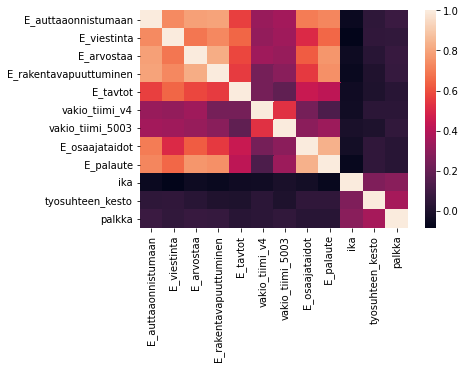

In [22]:
import seaborn as sns
sns.heatmap(C.corr())
plt.savefig("corr_tth.png")

In [24]:
# katsotaan miltä data näyttää 
D.describe()

,Unnamed: 0,E_auttaaonnistumaan,E_viestinta,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,vakio_tiimi_v4,vakio_tiimi_5003,E_osaajataidot,E_palaute,ika,tyosuhteen_kesto,LahtenytItse,palkka
count,3099.000000,1487.000000,1484.000000,1486.000000,1487.000000,1487.000000,1487.000000,1487.000000,1486.000000,1334.000000,3099.000000,3099.000000,3099.000000,2411.000000
mean,1549.000000,3.726768,3.710914,4.163656,3.718281,4.371328,4.360356,3.672709,3.707485,3.767079,16192.277164,1296.853148,0.325589,3145.389954
std,894.748568,0.497572,0.539509,0.541451,0.582029,0.447080,0.324854,0.488762,0.638172,0.641538,4474.528860,1626.667395,0.468670,542.359117
min,0.000000,2.166667,2.166667,2.600000,2.166667,3.000000,3.000000,2.333333,2.000000,2.333333,6296.000000,-98.442933,0.000000,0.000000
25%,774.500000,3.428571,3.375000,3.777778,3.300000,4.142857,4.058824,3.333333,3.200000,3.300000,12378.278545,174.500000,0.000000,2846.030000
50%,1549.000000,3.666667,3.707143,4.222222,3.666667,4.400000,4.333333,3.600000,3.750000,3.857143,15803.557090,646.000000,0.000000,3057.560000
75%,2323.500000,4.000000,4.000000,4.545455,4.000000,4.666667,4.625000,4.000000,4.142857,4.285714,19846.000000,1816.557067,1.000000,3329.280000
max,3098.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,28934.557090,11808.000000,1.000000,8000.000000


In [26]:
D.fillna(0,inplace=True)

In [27]:
D['Sukupuoli'] = D['Sukupuoli'].astype(float)

In [28]:
# Varmista että tietotyypit ovat ok
D.dtypes

Unnamed: 0                  int64
EmpHK                      object
E_auttaaonnistumaan       float64
E_viestinta               float64
E_arvostaa                float64
E_rakentavapuuttuminen    float64
E_tavtot                  float64
vakio_tiimi_v4            float64
vakio_tiimi_5003          float64
E_osaajataidot            float64
 E_palaute                float64
Sukupuoli                 float64
ika                       float64
tyosuhteen_kesto          float64
LahtenytItse                int64
palkka                    float64
dtype: object

In [18]:
# Halutaan ennustaa onko lähtenyt itse:
y=D['LahtenytItse']

# Muut muuttujat
#X=data[['EmpHK','E_auttaaonnistumaan', 'E_viestinta',
#       'E_arvostaa', 'E_rakentavapuuttuminen',
#       'E_tavtot', 'vakio_tiimi_v4', 'vakio_tiimi_5003', 'E_osaajataidot',
#      ' E_palaute', 'Sukupuoli', 'ika','tyosuhteen_kesto',
#       'LahtenytItse',' palkka2016', ' palkka2017',
#       ' palkka2018', ' palkka2019', ' palkka2020', ' palkka2021',
#       ' muutos2017', ' muutos2018', ' muutos2019', ' muutos2020',
#       ' muutos2021']]

In [19]:
#now split our data into train and test
train, test = train_test_split(D, test_size = 0.3)# in this our main data is splitted into train and test
# we can check their dimension
print(train.shape)
print(test.shape)

(2169, 15)
(930, 15)


In [20]:
# Lasketaan osuudet
train['LahtenytItse'].value_counts()

0    1460
1     709
Name: LahtenytItse, dtype: int64

In [21]:
train

,EmpHK,E_auttaaonnistumaan,E_viestinta,E_arvostaa,E_rakentavapuuttuminen,E_tavtot,vakio_tiimi_v4,vakio_tiimi_5003,E_osaajataidot,E_palaute,Sukupuoli,ika,tyosuhteen_kesto,LahtenytItse,palkka
2690,0xE49B086674BA6B7C91C94B4FE0CB6328,3.750000,3.555556,4.555556,3.75,4.555556,4.000000,3.333333,3.888889,3.500,1.0,21851.55709,2882.557067,0,4583.77
2280,0x49FF22C595097C4CBC3FEF65B431EFC0,3.428571,3.714286,3.285714,3.00,4.285714,4.285714,3.714286,3.142857,2.800,1.0,16471.00000,223.000000,1,3096.67
923,0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000,1.0,18503.55709,1939.557067,0,3203.72
1604,0x2C4D0B36E64A7709C5B7AD217D5F80BC,3.600000,3.000000,4.000000,3.30,4.600000,4.300000,3.500000,3.800000,3.625,1.0,20160.00000,3747.000000,1,3135.51
2458,0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000,1.0,18725.55709,387.557067,0,3570.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2871,0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000,1.0,13599.55709,996.557067,0,3087.24
1456,0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000,1.0,16263.00000,635.000000,1,0.00
632,0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000,1.0,17221.00000,109.000000,0,2890.01
1899,0,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000,1.0,10013.00000,181.000000,0,0.00


# Random Forest -luokittelija

In [22]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
#X, y = make_classification(n_samples=1000, n_features=4,
#                           n_informative=2, n_redundant=0,
#                           random_state=0, shuffle=False)
#clf = RandomForestClassifier(max_depth=2, random_state=0)


train_X = train[['E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto','palkka']]


train_y=train.LahtenytItse
# This is output of our training data
# same we have to do for test
test_X= test[['E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto','palkka']]
# taking test data inputs
test_y =test.LahtenytItse   #output value of test dat

In [26]:
train_y.value_counts()

0    1460
1     709
Name: LahtenytItse, dtype: int64

In [25]:
# rakennetaan luokittelija käyttäen train-joukkoa
model=RandomForestClassifier(n_estimators=100)

model.fit(train_X, train_y)

y_pred=model.predict(test_X)

In [27]:
y_pred

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,

In [28]:
print("ei-lähteneet:",len(y_pred)-y_pred.sum())
print("lähteneet:",
      y_pred.sum())

ei-lähteneet: 676
lähteneet: 254


Accuracy: 0.7118279569892473
[[519 111]
 [157 143]]


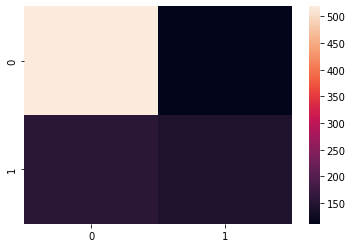

In [29]:
# Metrics-paketti mallin tarkkuuden arviointiin, ja sieltä confusion_matrix
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import seaborn

# Mallin tarkkuus:
print("Accuracy:",metrics.accuracy_score(test_y, y_pred))

# Visualisoidaan confusion matrix heatmappina
from sklearn.metrics import confusion_matrix
CM = confusion_matrix(test_y, y_pred)
print(CM)

seaborn.heatmap(CM)
plt.show()

# Ennusti oikein 547 pysynyttä, 120 lähtenyttä
# ennusti väärin 85 henkilöä lähteneeksi (jotka olivat pysyneet)
# ennusti väärin 178 henkilöä pysyneeksi (jotka olivat lähteneet)

In [30]:
train_X.columns

Index(['E_auttaaonnistumaan', 'E_viestinta', 'E_arvostaa',
       'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto', 'palkka'],
      dtype='object')

In [31]:
# Featureiden nimet ylös
feature_names=[]
for c in train_X.columns:
    feature_names.append(c)
feature_names

['E_auttaaonnistumaan',
 'E_viestinta',
 'E_arvostaa',
 'E_rakentavapuuttuminen',
 'E_tavtot',
 'vakio_tiimi_v4',
 'vakio_tiimi_5003',
 'E_osaajataidot',
 ' E_palaute',
 'Sukupuoli',
 'ika',
 'tyosuhteen_kesto',
 'palkka']

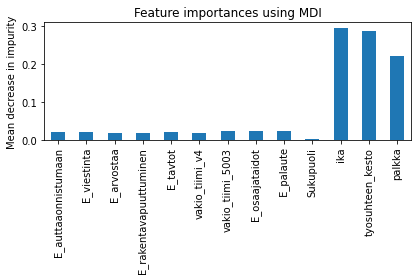

In [32]:
# Random forest -mallin muuttujien painoarvo
import time
import numpy as np


importances = model.feature_importances_
std = np.std([model.feature_importances_ for tree in model.estimators_], axis=0)

forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

Elapsed time to compute the importances: 1.351 seconds


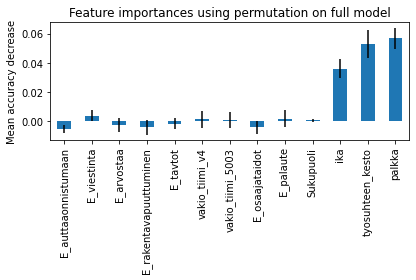

In [138]:
from sklearn.inspection import permutation_importance

start_time = time.time()
result = permutation_importance(
    model, test_X, test_y, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [103]:
std

array([4.85722573e-17, 8.32667268e-17, 4.16333634e-17, 2.77555756e-17,
       1.38777878e-17, 3.12250226e-17, 7.63278329e-17, 4.85722573e-17,
       6.24500451e-17, 7.63278329e-17, 0.00000000e+00, 2.77555756e-16,
       2.49800181e-16])

# Gaussin luokittelija

In [29]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt

# Kerätään uusiksi:
x = D[['E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto','palkka']]
y = D['LahtenytItse'].values


# Normalisoidaan:
x = (x - np.min(x)) / (np.max(x) - np.min(x))

# Testi- ja train-joukkoihin jako
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 42)

In [30]:
# Sovitetaan malli:
from sklearn.naive_bayes import GaussianNB
nb = GaussianNB()
nb.fit(x_train, y_train)


GaussianNB()

In [31]:
# Tutkitaan mallin scorea:
print("Naive Bayesin score (asteikolla [0-1]):",nb.score(x_test, y_test))


Naive Bayesin score (asteikolla [0-1]): 0.5731182795698925


# SVM

In [32]:
from sklearn import svm

# Testataan vielä svm-luokittelija
clf = svm.SVC(kernel='linear') 
clf.fit(x_train, y_train)


y_pred = clf.predict(x_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.6924731182795699


In [33]:
# tarkkuus

# Mallin tarkkuus:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

# Visualisoidaan confusion matrix heatmappina
from sklearn.metrics import confusion_matrix
CM = confusion_matrix(y_test, y_pred)
print(CM)

#seaborn.heatmap(CM)
#plt.show()


Accuracy: 0.6924731182795699
[[644   0]
 [286   0]]


In [34]:
!pip install --upgrade scikit-learn

!pip install scipy

!pip3 install -U scikit-learn scipy matplotlib

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [148]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
#from sklearn.inspection import DecisionBoundaryDisplay


In [35]:
x = D[['E_auttaaonnistumaan', 'E_viestinta',
       'E_arvostaa', 'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto','palkka']]
X=x
y = D['LahtenytItse'].values

In [160]:
x.columns

Index(['E_auttaaonnistumaan', 'E_viestinta', 'E_arvostaa',
       'E_rakentavapuuttuminen', 'E_tavtot', 'vakio_tiimi_v4',
       'vakio_tiimi_5003', 'E_osaajataidot', ' E_palaute', 'Sukupuoli', 'ika',
       'tyosuhteen_kesto', 'palkka'],
      dtype='object')

In [23]:
test_X.value_counts()

E_auttaaonnistumaan  E_viestinta  E_arvostaa  E_rakentavapuuttuminen  E_tavtot  vakio_tiimi_v4  vakio_tiimi_5003  E_osaajataidot   E_palaute  Sukupuoli  ika           tyosuhteen_kesto   palkka2016   palkka2017   palkka2018   palkka2019   palkka2020   palkka2021   muutos2017   muutos2018   muutos2019   muutos2020   muutos2021
5.0                  5.000000     5.00        5.0                     5.000000  5.00            5.00              5.00            5.0         1.0        23780.000000  3468.000000       0.00         0.00         0.00         0.00         0.00         0.00         0.0          0.0          0.0          0.0          0.0            1
3.5                  3.666667     4.25        4.0                     4.333333  4.25            3.75              4.25            4.0         0.0        15267.368597  917.368581        0.00         0.00         0.00         0.00         7.15         7.15         0.0          0.0          0.0          0.0          0.0            1
         

In [41]:
#dh_data.groupby(['kategoria','tyontekijoita']).mean()

In [ ]:
# JATKA Korjaa ylempi

In [62]:
laskutus=tth_data[['TTH', 'nimi', 'Henkilo_ID', 'listahinta']].groupby(['TTH','nimi','Henkilo_ID']).sum().reset_index()


#.groupby('listahinta').sum()



## TODO: Tarkista miksi samalla DH-tunnuksella on useampi esihenkilö -> useampi työsuhde
## TArkista että listahinta ei monistu kun data joinataan

In [63]:
laskutus

,TTH,nimi,Henkilo_ID,listahinta
0,0ALG,Peltoniemi Anne-Liina,74118.0,72261.2
1,0ARY,Ryhänen Tuulikki,48169.0,87863.0
2,0ASZ,Alatalo Sanna,52753.0,71313.5
3,0AUV,Auvinen Anne,49895.0,12240.3
4,0AYH,Haiko Arja-Sinikka,72968.0,124957.5
...,...,...,...,...
867,PSMO,Montonen Sanna,38720.0,84046.4
868,SIL,Lassila Sirpa,38621.0,27874.6
869,TARL,Tarkiainen Lena,79570.0,32959.5
870,VLEJ,Lehtonen Johanna,74208.0,5852.2


In [46]:
#data=pd.merge(tth_data,esimiehet, left_on='nimi', right_on='Nimi')

In [78]:
#test=osaaja_keskiarvot[osaaja_keskiarvot[['Esimieheni auttaa minua onnistumaan työssäni ',
       'Esimieheni toimii oikeudenmukaisesti',
       'Esimieheni arvostaa minua ja työtäni ',
       'Esimieheni puuttuu ongelmatilanteisiin rakentavasti ',
       'Esimieheni viestii riittävästi tiimiimme liittyvistä asioista ',
       'Esimieheni seuraa säännöllisesti tavoitteiden toteutumista ',
       'Esimieheni toimii esimiestyössään osaajataitojen mukaisesti ',
       ' Esimieheni on avoin palautteelle ja on halukas oppimaan siitä',
       'vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)',
       'vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)']] <6]

In [94]:
#osaaja_keskiarvot['vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)']<6

0       True
1       True
2       True
3       True
4       True
        ... 
3916    True
3922    True
3924    True
3927    True
3928    True
Name: vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?), Length: 3205, dtype: bool

In [102]:
#osaaja=osaaja_keskiarvot[(osaaja_keskiarvot['Esimieheni auttaa minua onnistumaan työssäni ']<6) &
                 (osaaja_keskiarvot['Esimieheni toimii oikeudenmukaisesti']<6) &
                 (osaaja_keskiarvot['Esimieheni puuttuu ongelmatilanteisiin rakentavasti ']<6) &
                 (osaaja_keskiarvot['Esimieheni viestii riittävästi tiimiimme liittyvistä asioista ']<6) &
                 (osaaja_keskiarvot['Esimieheni seuraa säännöllisesti tavoitteiden toteutumista ']<6) &
                 (osaaja_keskiarvot['Esimieheni toimii esimiestyössään osaajataitojen mukaisesti ']<6) &
                 (osaaja_keskiarvot[' Esimieheni on avoin palautteelle ja on halukas oppimaan siitä']<6) &
                (osaaja_keskiarvot['vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)']<6) &
                 (osaaja_keskiarvot['vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)']<6) 
                 
                 ]

In [103]:
keskiarvot=osaaja.groupby('esimies').mean()

In [105]:
keskiarvot

,Esimieheni auttaa minua onnistumaan työssäni,Esimieheni toimii oikeudenmukaisesti,Esimieheni arvostaa minua ja työtäni,Esimieheni puuttuu ongelmatilanteisiin rakentavasti,Esimieheni viestii riittävästi tiimiimme liittyvistä asioista,Esimieheni seuraa säännöllisesti tavoitteiden toteutumista,Esimieheni toimii esimiestyössään osaajataitojen mukaisesti,Esimieheni on avoin palautteelle ja on halukas oppimaan siitä,vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)
esimies,,,,,,,,,,
Aallonvuori Erika,4.600000,4.600000,4.400000,4.600000,4.600000,4.200000,4.600000,4.600000,4.200000,4.200000
Aallosvirta Jenni,4.666667,4.666667,4.666667,4.666667,4.666667,4.666667,4.666667,4.333333,4.000000,4.000000
Aarnio Ari-Pekka,2.300000,2.900000,3.700000,2.500000,2.200000,2.700000,2.700000,3.200000,4.000000,4.200000
Aho Pasi,4.666667,4.666667,5.000000,4.666667,4.666667,4.666667,4.666667,4.666667,4.666667,4.000000
Aho Pia,4.250000,4.500000,4.250000,4.500000,4.250000,4.250000,4.500000,4.250000,4.750000,4.750000
...,...,...,...,...,...,...,...,...,...,...
Ylimikkotervo Heidi,4.000000,3.333333,4.333333,4.333333,3.333333,3.333333,4.000000,4.333333,4.333333,4.333333
Ylönen Sanna,3.666667,3.888889,4.111111,3.666667,3.444444,4.000000,3.777778,3.888889,4.555556,3.555556
Ylöstalo Mari,3.777778,3.555556,4.222222,3.333333,3.222222,3.555556,3.444444,3.333333,4.222222,4.222222


In [48]:
data.groupby(['TTH','Esimies','LY_TUNNUS','tyontekijoita','hoitajia','Henkilo_ID']).sum().reset_index().columns

Index(['TTH', 'Esimies', 'LY_TUNNUS', 'tyontekijoita', 'hoitajia',
       'Henkilo_ID', 'listahinta', 'terveystarkastus', 'LY_TUNNUS.1',
       'Henkilo_id', 'Esimieshlonro'],
      dtype='object')

In [49]:
#summataanko listahinnat? Välittämättä onko terveystarkastuksia ja Kela-työ
d=data.groupby(['TTH','Esimies','LY_TUNNUS','tyontekijoita','hoitajia','Henkilo_ID']).sum().reset_index()[['TTH', 'Esimies', 'LY_TUNNUS', 'tyontekijoita', 'hoitajia',
       'Henkilo_ID', 'listahinta']]

In [66]:
d

,TTH,Esimies,LY_TUNNUS,tyontekijoita,hoitajia,Henkilo_ID,listahinta
0,0ALG,Rauhala Seija,106080.0,808.0,1.0,74118.0,440.0
1,0ALG,Rauhala Seija,173658.0,292.0,1.0,74118.0,614.4
2,0ALG,Rauhala Seija,190069.0,309.0,1.0,74118.0,345.6
3,0ALG,Rauhala Seija,285517.0,668.0,1.0,74118.0,806.4
4,0ALG,Rauhala Seija,285518.0,456.0,1.0,74118.0,86.4
...,...,...,...,...,...,...,...
44156,VLEJ,Salmi Hannele,182027.0,280.0,3.0,74208.0,3504.2
44157,VLEJ,Virkkunen Anne,173122.0,60.0,2.0,74208.0,86.4
44158,VLEJ,Virkkunen Anne,181215.0,630.0,2.0,74208.0,2261.6
44159,VLEJ,Virkkunen Anne,182027.0,280.0,3.0,74208.0,3504.2


In [51]:
D=pd.merge(d,keskiarvot,left_on='Esimies',right_on='esimies')

NameError: name 'keskiarvot' is not defined

In [127]:
D['huollettavia']=D.tyontekijoita/D.hoitajia


In [183]:
osaaja

,esimies,Esimieheni auttaa minua onnistumaan työssäni,Esimieheni toimii oikeudenmukaisesti,Esimieheni arvostaa minua ja työtäni,Esimieheni puuttuu ongelmatilanteisiin rakentavasti,Esimieheni viestii riittävästi tiimiimme liittyvistä asioista,Esimieheni seuraa säännöllisesti tavoitteiden toteutumista,Esimieheni toimii esimiestyössään osaajataitojen mukaisesti,Esimieheni on avoin palautteelle ja on halukas oppimaan siitä,vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)
1,Palonen Unto,2.0,2.0,3.0,1.0,1.0,2.0,2.0,2.0,3,2
2,Toivonen Taru,4.0,4.0,3.0,3.0,5.0,5.0,4.0,4.0,4,3
3,Tuikkala Raija,3.0,2.0,2.0,3.0,3.0,4.0,3.0,3.0,5,4
4,Uotinen Anu,4.0,5.0,5.0,5.0,5.0,4.0,5.0,5.0,4,4
5,Myllynen Mika,3.0,3.0,4.0,4.0,2.0,3.0,3.0,3.0,4,4
...,...,...,...,...,...,...,...,...,...,...,...
3916,Luoto Ritva,5.0,4.0,4.0,1.0,1.0,2.0,2.0,2.0,4,4
3922,Niittykallio Heidi,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4,4
3924,Pietilä Maiju,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,2,3
3927,Maccelli Antonia,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5,5


In [149]:
DDD=D[['TTH', 'Esimies', 
       'Henkilo_ID', 'listahinta',
       'Esimieheni auttaa minua onnistumaan työssäni ',
       'Esimieheni toimii oikeudenmukaisesti',
       'Esimieheni arvostaa minua ja työtäni ',
       'Esimieheni puuttuu ongelmatilanteisiin rakentavasti ',
       'Esimieheni viestii riittävästi tiimiimme liittyvistä asioista ',
       'Esimieheni seuraa säännöllisesti tavoitteiden toteutumista ',
       'Esimieheni toimii esimiestyössään osaajataitojen mukaisesti ',
       ' Esimieheni on avoin palautteelle ja on halukas oppimaan siitä',
       'vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)',
       'vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)',
       'huollettavia']]

In [152]:
df=DDD.groupby(['TTH', 'Esimies', 
       'Henkilo_ID', 
       'Esimieheni auttaa minua onnistumaan työssäni ',
       'Esimieheni toimii oikeudenmukaisesti',
       'Esimieheni arvostaa minua ja työtäni ',
       'Esimieheni puuttuu ongelmatilanteisiin rakentavasti ',
       'Esimieheni viestii riittävästi tiimiimme liittyvistä asioista ',
       'Esimieheni seuraa säännöllisesti tavoitteiden toteutumista ',
       'Esimieheni toimii esimiestyössään osaajataitojen mukaisesti ',
       ' Esimieheni on avoin palautteelle ja on halukas oppimaan siitä',
       'vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)',
       'vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?)',
       ]).sum()

In [156]:
df=df.reset_index()

In [172]:
df

,TTH,Esimies,Henkilo_ID,Esimieheni auttaa minua onnistumaan työssäni,Esimieheni toimii oikeudenmukaisesti,Esimieheni arvostaa minua ja työtäni,Esimieheni puuttuu ongelmatilanteisiin rakentavasti,Esimieheni viestii riittävästi tiimiimme liittyvistä asioista,Esimieheni seuraa säännöllisesti tavoitteiden toteutumista,Esimieheni toimii esimiestyössään osaajataitojen mukaisesti,Esimieheni on avoin palautteelle ja on halukas oppimaan siitä,vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),listahinta,huollettavia
0,0ARY,Mahlakaarto Suvi,48169.0,4.000000,3.800000,4.400000,3.600000,3.800000,4.400000,4.600000,4.600000,4.600000,3.400000,87863.0,13172.500000
1,0ASZ,Kähkölä Maija-Liisa,52753.0,3.714286,4.428571,4.571429,4.142857,3.428571,4.285714,4.000000,4.000000,4.857143,4.428571,142627.0,46420.000000
2,0ASZ,Väisänen Annika,52753.0,3.214286,3.428571,3.142857,3.357143,3.285714,3.357143,3.000000,3.357143,3.357143,3.285714,71313.5,46420.000000
3,0AUV,Elsilä Minna,49895.0,3.600000,3.600000,4.200000,3.400000,4.200000,5.000000,4.000000,3.600000,4.200000,4.400000,12240.3,240.750000
4,0AZK,Mahlakaarto Suvi,72849.0,4.000000,3.800000,4.400000,3.600000,3.800000,4.400000,4.600000,4.600000,4.600000,3.400000,191041.2,7625.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
577,PSMO,Käyhty Mari,38720.0,3.800000,4.000000,4.400000,3.000000,3.200000,4.600000,4.200000,4.000000,4.600000,4.000000,84046.4,7403.083333
578,SIL,Varonen Essi,38621.0,4.250000,4.625000,4.750000,4.000000,4.125000,4.250000,4.375000,4.625000,4.500000,3.750000,27874.6,1694.666667
579,VLEJ,Mattila Maarit,74208.0,4.000000,4.000000,4.000000,4.500000,4.000000,5.000000,3.500000,3.000000,4.000000,4.500000,5852.2,438.333333
580,VLEJ,Salmi Hannele,74208.0,4.400000,4.700000,4.700000,4.500000,4.500000,4.500000,4.700000,4.600000,4.400000,3.900000,5852.2,438.333333


In [157]:
corr=df.corr()
corr.style.background_gradient(cmap='coolwarm')


,Henkilo_ID,Esimieheni auttaa minua onnistumaan työssäni,Esimieheni toimii oikeudenmukaisesti,Esimieheni arvostaa minua ja työtäni,Esimieheni puuttuu ongelmatilanteisiin rakentavasti,Esimieheni viestii riittävästi tiimiimme liittyvistä asioista,Esimieheni seuraa säännöllisesti tavoitteiden toteutumista,Esimieheni toimii esimiestyössään osaajataitojen mukaisesti,Esimieheni on avoin palautteelle ja on halukas oppimaan siitä,vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),listahinta,huollettavia
Henkilo_ID,1.000000,-0.088323,-0.068362,0.049888,-0.022570,-0.050342,-0.040189,-0.090408,-0.056722,-0.087807,-0.053602,-0.173824,-0.089616
Esimieheni auttaa minua onnistumaan työssäni,-0.088323,1.000000,0.826031,-0.073403,0.806390,0.758770,0.442784,0.860161,0.783827,0.230019,0.506809,0.062806,0.002489
Esimieheni toimii oikeudenmukaisesti,-0.068362,0.826031,1.000000,-0.124373,0.810176,0.754111,0.400767,0.828674,0.824686,0.279219,0.546516,0.032990,-0.032456
Esimieheni arvostaa minua ja työtäni,0.049888,-0.073403,-0.124373,1.000000,-0.074712,-0.086712,-0.138359,-0.095162,0.002190,0.031844,-0.004416,-0.033376,0.016076
Esimieheni puuttuu ongelmatilanteisiin rakentavasti,-0.022570,0.806390,0.810176,-0.074712,1.000000,0.683448,0.499952,0.770844,0.743435,0.066892,0.424694,0.073558,0.002626
Esimieheni viestii riittävästi tiimiimme liittyvistä asioista,-0.050342,0.758770,0.754111,-0.086712,0.683448,1.000000,0.584069,0.817076,0.695828,0.274474,0.494326,0.051874,-0.042794
Esimieheni seuraa säännöllisesti tavoitteiden toteutumista,-0.040189,0.442784,0.400767,-0.138359,0.499952,0.584069,1.000000,0.559500,0.368250,0.104843,0.100247,0.049484,0.050884
Esimieheni toimii esimiestyössään osaajataitojen mukaisesti,-0.090408,0.860161,0.828674,-0.095162,0.770844,0.817076,0.559500,1.000000,0.890377,0.177517,0.462483,0.046498,0.012835
Esimieheni on avoin palautteelle ja on halukas oppimaan siitä,-0.056722,0.783827,0.824686,0.002190,0.743435,0.695828,0.368250,0.890377,1.000000,0.079416,0.401282,0.021001,-0.002083
vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),-0.087807,0.230019,0.279219,0.031844,0.066892,0.274474,0.104843,0.177517,0.079416,1.000000,0.502875,0.016384,-0.013473


In [184]:
df

,TTH,Esimies,Henkilo_ID,Esimieheni auttaa minua onnistumaan työssäni,Esimieheni toimii oikeudenmukaisesti,Esimieheni arvostaa minua ja työtäni,Esimieheni puuttuu ongelmatilanteisiin rakentavasti,Esimieheni viestii riittävästi tiimiimme liittyvistä asioista,Esimieheni seuraa säännöllisesti tavoitteiden toteutumista,Esimieheni toimii esimiestyössään osaajataitojen mukaisesti,Esimieheni on avoin palautteelle ja on halukas oppimaan siitä,vakio_tiimi_v4 : Voin luottaa kollegoiden apuun ja tukeen (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),vakio_tiimi_5003 : Yhteistyö eri ammattiryhmien välillä toimii hyvin (Työyhteisö - Kuinka samaa mieltä olet seuraavista lähityöyhteisöösi liittyvistä asioista?),listahinta,huollettavia
0,0ARY,Mahlakaarto Suvi,48169.0,4.000000,3.800000,4.400000,3.600000,3.800000,4.400000,4.600000,4.600000,4.600000,3.400000,87863.0,13172.500000
1,0ASZ,Kähkölä Maija-Liisa,52753.0,3.714286,4.428571,4.571429,4.142857,3.428571,4.285714,4.000000,4.000000,4.857143,4.428571,142627.0,46420.000000
2,0ASZ,Väisänen Annika,52753.0,3.214286,3.428571,3.142857,3.357143,3.285714,3.357143,3.000000,3.357143,3.357143,3.285714,71313.5,46420.000000
3,0AUV,Elsilä Minna,49895.0,3.600000,3.600000,4.200000,3.400000,4.200000,5.000000,4.000000,3.600000,4.200000,4.400000,12240.3,240.750000
4,0AZK,Mahlakaarto Suvi,72849.0,4.000000,3.800000,4.400000,3.600000,3.800000,4.400000,4.600000,4.600000,4.600000,3.400000,191041.2,7625.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
577,PSMO,Käyhty Mari,38720.0,3.800000,4.000000,4.400000,3.000000,3.200000,4.600000,4.200000,4.000000,4.600000,4.000000,84046.4,7403.083333
578,SIL,Varonen Essi,38621.0,4.250000,4.625000,4.750000,4.000000,4.125000,4.250000,4.375000,4.625000,4.500000,3.750000,27874.6,1694.666667
579,VLEJ,Mattila Maarit,74208.0,4.000000,4.000000,4.000000,4.500000,4.000000,5.000000,3.500000,3.000000,4.000000,4.500000,5852.2,438.333333
580,VLEJ,Salmi Hannele,74208.0,4.400000,4.700000,4.700000,4.500000,4.500000,4.500000,4.700000,4.600000,4.400000,3.900000,5852.2,438.333333


In [159]:
# paketit

import pandas_profiling
import numpy as np

# ajetaan profilointi
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
listahinnat

,TTH,listahinta,vuosi,KELA,terveystarkastus
0,"﻿"" """,172.8,2117,0,0
1,,228.8,2120,0,0
2,,7754.4,2115,0,0
3,,2743.2,2116,0,0
4,,2481.6,2116,K1,0
...,...,...,...,...,...
34357,VLEJ,3369.6,2121,0,0
34358,VMA,1538.5,2117,0,0
34359,ÄIM,3369.6,2115,K1,1
34360,ÄIM,4934.4,2115,K1,0


In [43]:
tth_data

,TTH,nimi,Henkilo_ID,LY_TUNNUS,TOIMIALANIMI,tyontekijoita,kategoria,hoitajia,TTH.1,listahinta,KELA,terveystarkastus,LY_TUNNUS.1
0,﻿1MZC,Konttila Marja,83215.0,285742.0,Ravintolat,375.0,50+,1.0,1MZC,86.4,K1,0,285742
1,1MZC,Konttila Marja,83215.0,285742.0,Ravintolat,375.0,50+,1.0,1MZC,86.4,0,0,285742
2,1MZR,Rilla Marianna,59972.0,395404.0,Ohjelmistojen suunnittelu ja valmistus,48.0,10-49,1.0,1MZR,777.6,K1,0,395404
3,1MZR,Rilla Marianna,59972.0,395404.0,Ohjelmistojen suunnittelu ja valmistus,48.0,10-49,1.0,1MZR,345.6,K1,1,395404
4,1MZT,Muhonen Tuija,54973.0,171950.0,Muiden kiinteistöjen vuokraus ja hallinta,23.0,10-49,1.0,1MZT,518.4,K1,1,171950
...,...,...,...,...,...,...,...,...,...,...,...,...,...
167064,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4EMX,86.4,0,0,105947
167065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8ARX,608.9,0,0,890156
167066,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8ARX,2073.6,K1,0,890156
167067,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8ARX,172.8,K1,1,890156


In [10]:
TMPsop

,TTH,LY_TUNNUS,TOIMIPISTE
0,0RMK,998362,0KEJ
1,5MPO,592550,5POR
2,4PCX,497502,4TKU
3,8MTS,895082,8MCE
4,6LHA,465611,4PUL
...,...,...,...
131093,9MKZ,943169,9VLI
131094,9MKZ,947060,9LEP
131095,3TIS,492638,3SPM
131096,0LNB,171981,0OLU


In [12]:
TMPhoitajat

NameError: name 'TMPhoitajat' is not defined

In [10]:


# TTH:n asiakasyritysten maara
select distinct s.TTH as TTH , nimi, tth.Henkilo_ID
, s.LY_TUNNUS
,TOIMIALA
,t.tyontekijoita
, case when tyontekijoita = 1 then '1'
when tyontekijoita > 1 and tyontekijoita < 10 then '2-9'
when tyontekijoita > 9 and tyontekijoita < 50 then '10-49'
else '50+' end as kategoria 
,h.hoitajia
--FROM [Doctorex_mirror].[dbo].[sop_asemat] s 
FROM #TMPsop s
INNER JOIN #TMPhoitajat h on h.LY_TUNNUS = s.LY_TUNNUS and h.TOIMIPISTE = s.TOIMIPISTE
INNER JOIN #TMPtt t on t.LY_TUNNUS = s.LY_TUNNUS and s.TOIMIPISTE = TTARK_TMP
LEFT JOIN #TMPTTH tth on tth.TTH = s.TTH
where len(s.TTH)>0 --and TOIMIPISTE=TTARK_TMP
order by TTH, s.LY_TUNNUS 
*/

SyntaxError: invalid syntax (<ipython-input-10-52cad94d5b9f>, line 2)

In [7]:
# Luetaan csv:t, lähdekoodit: https://bitbucket.org/terveystalo/dar-common/src/master/sql/sonja/
#tth=pd.read_csv(basepath+'tth_yrityskytkennat.csv',sep=';')
#aikalajit=pd.read_csv(basepath+'aikalajit.csv',sep=';')
#vuosilaskutus=pd.read_csv(basepath+'vuosilaskutus.csv',sep=';')
#uusi_vuosilaskutus=pd.read_csv(basepath+'uusi